In [17]:
import sys
import os
sys.path = [p for p in sys.path if "ParaView" not in p]
sys.path.append("/home/haseeb/Notebooks/Parameteric_DMD_cylinder_2D_modules")
import visualization_utilities_snapshot_noise as viz



import torch as pt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.tri as mtri
from flowtorch import DATASETS
from flowtorch.data import FOAMDataloader, mask_box
from pydmd import DMD, HODMD, ParametricDMD
from ezyrb import POD, Database, RBF, GPR, Linear
import seaborn as sns
from matplotlib.patches import Circle

from pathlib import Path
import re
# For High Quality Visuals
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 160  # crisp visuals


# Training and test paramter for the partitioned parametericDMD

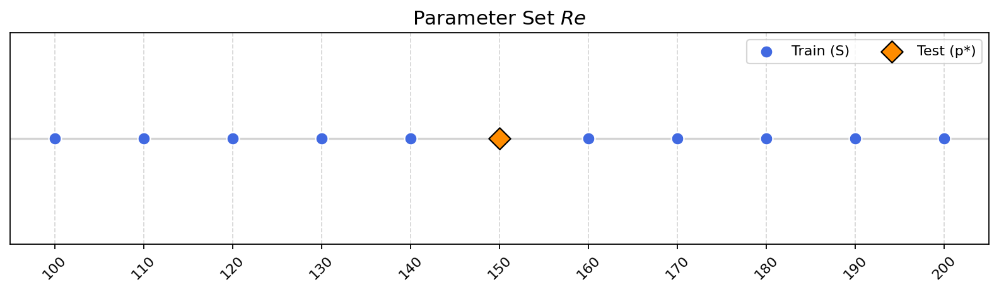

In [18]:
# Training and test parameters 

# Training parameter set
Re_list = np.array([100, 110, 120, 130, 140, 160, 170, 180, 190, 200])  # S: training parameters

# Test parameter 
Re_test = 150   # test parameter

# Visualization of parameter set and test parameter
fig, ax = plt.subplots(figsize=(10, 3))
plt.title('Parameter Set $Re$', fontsize=14)

# Plot all training parameters 
ax.scatter(Re_list, np.zeros_like(Re_list), 
           marker='o', s=80, color='royalblue', edgecolor='white', 
           label='Train (S)', zorder=3)

# Plot test parameter
ax.scatter(Re_test, 0, 
           marker='D', s=120, color='darkorange', edgecolor='black', 
           label='Test (p*)', zorder=4)

# Formatting
plt.xticks(np.append(Re_list, Re_test), rotation=45, fontsize=10)
plt.yticks([])
ax.axhline(0, color='lightgray', linewidth=1.5, zorder=1)   # baseline line
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(ncols=2, frameon=True, fontsize=10)

plt.tight_layout()
plt.show()

In [19]:
# Load and prepare data

from Parameteric_DMD_cylinder_2D_modules.data_loader import (
    load_all_snapshots,
    add_test_parameter
)
import os

# Base folder containing simulation data
base_path = os.path.expanduser("~/OpenFOAM/test_1")

# Time windows
training_window = (10.0, 15.0)  # Time range for training snapshots
future_window = (15.0, 20.0)    # Time range for future prediction
test_window = (3.0, 20.0)       # Time range for test Reynolds number

# Sampling step for downsampling time steps
sampling_step = 1

# Load training and future snapshots for all training Reynolds numbers
data = load_all_snapshots(
    Re_list=Re_list,
    base_path=base_path,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    training_window=training_window,
    future_window=future_window,
    sampling_step=sampling_step
)

# Access all training and test data from the updated dictionary

snapshot_dict = data["snapshot_dict"]                 # velocity snapshots per Re
sampled_times_dict = data["sampled_times_dict"]       # time vectors per Re
snapshot_future_dict = data["snapshot_future_dict"]   # future snapshots (15–20s) per Re
sampled_times_future_dict = data["sampled_times_future_dict"]  # future time vectors per Re
masked_coords_dict = data["masked_coords_dict"]       # masked coordinates per Re
num_points_dict = data["num_points_dict"]             # number of spatial points per Re
mask_dict = data["mask_dict"]                         # spatial mask arrays per Re
loader_dict = data["loader_dict"]                     # FOAMDataloader instances per Re


# Add test snapshots for an unseen Reynolds number
path_test = f"{base_path}/cylinder_2D_Re{Re_test}"
data = add_test_parameter(
    data=data,
    Re=Re_test,
    path=path_test,
    mask_box=mask_box,
    FOAMDataloader=FOAMDataloader,
    time_window=test_window,
    sampling_step=sampling_step
)

# Access test data directly from unified dictionaries
snapshot_test   = snapshot_dict[Re_test]
num_points_test = num_points_dict[Re_test]
times_test      = sampled_times_dict[Re_test]
mask_test       = mask_dict[Re_test]
coords_test     = masked_coords_dict[Re_test]
loader_test     = loader_dict[Re_test]



Re=100: Masked points = 5746
Re=110: Masked points = 5746
Re=120: Masked points = 5746
Re=130: Masked points = 5746
Re=140: Masked points = 5746
Re=160: Masked points = 5746
Re=170: Masked points = 5746
Re=180: Masked points = 5746
Re=190: Masked points = 5746
Re=200: Masked points = 5746
All snapshots loaded.
Test Re=150: Loaded snapshot shape = (11492, 1701)


## Subtract mean flow and normalize the snapshots

In [20]:
from Parameteric_DMD_cylinder_2D_modules.preprocess_snapshots import preprocess_snapshots

# Preprocess training snapshots (10.0–15.0 s window) and test Re in one call
train_snapshots, mean_flow, snapshot_processed_dict, norm_scales = preprocess_snapshots(
    snapshot_dict,   # dictionary of raw snapshots loaded earlier
    Re_list,         # list of training Reynolds numbers
    Re_test=Re_test  # optional test Reynolds number to preprocess with same mean flow
)

# Print diagnostic information about shapes and normalization
print("Training snapshots shape:", train_snapshots.shape)
print("Mean flow shape:", mean_flow.shape)
print(f"Test Re={Re_test}: processed shape = {snapshot_processed_dict[Re_test].shape}, "
      f"norm scale = {norm_scales[Re_test]:.4f}")


Mean flow computed from training window Shape: (11492,)
Mean flow subtracted and snapshots normalized for each snapshot matrix.
train_snapshots shape: (10, 11492, 501)
Test Re=150: processed shape = (11492, 1701), norm scale = 1147.8000
Training snapshots shape: (10, 11492, 501)
Mean flow shape: (11492,)
Test Re=150: processed shape = (11492, 1701), norm scale = 1147.8000


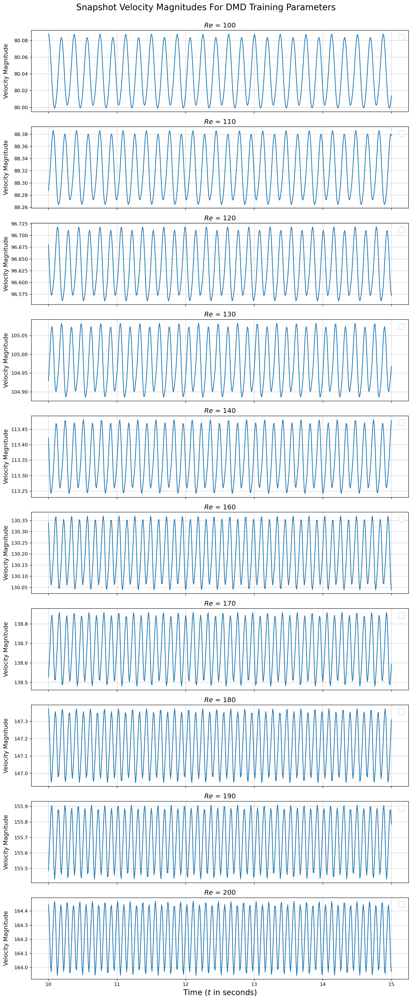

In [21]:
# Snapshot magnitude over time for each Parameter i.e., Reynolds number

import logging
from visualization_utilities import plot_snapshot_magnitudes

# Suppress INFO messages from flowtorch FOAMDataloader
logging.getLogger("flowtorch.data.foam_dataloader").setLevel(logging.WARNING)

loader_dict = data["loader_dict"]

plot_snapshot_magnitudes(snapshot_dict, sampled_times_dict, Re_list)



## Offline Phase

## Step 1: Perform POD and DMD on the concatenated snapshot matrix X1

Available noise levels: [0, 10, 20, 40]


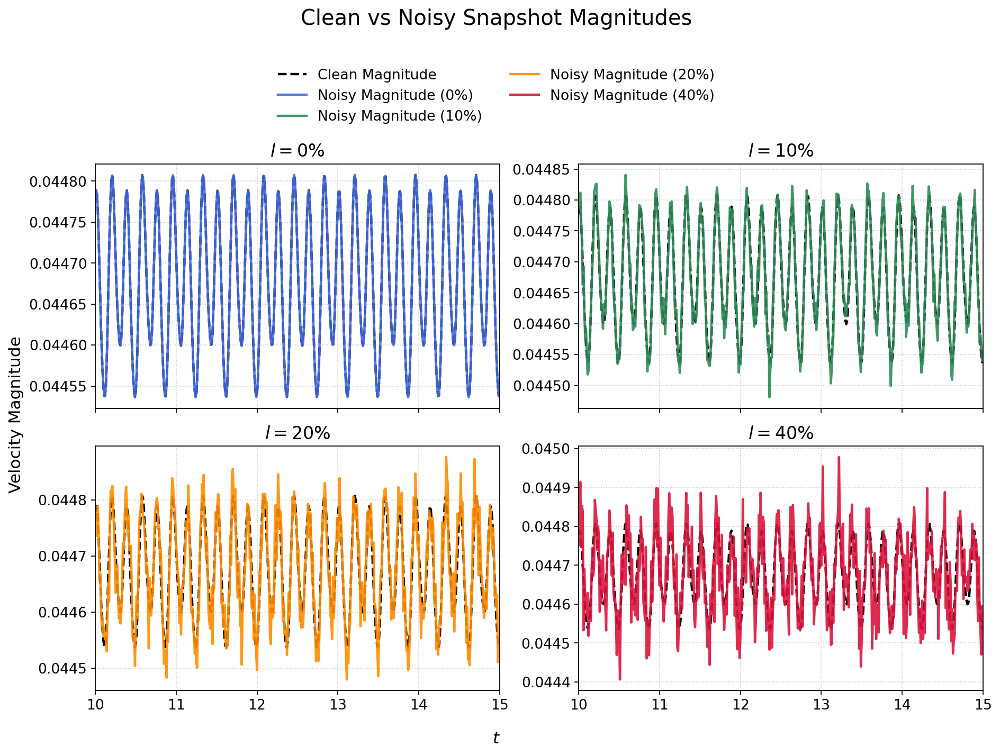

In [22]:
# Add and visualize the Gaussian noise to the snapshot matrix


from dmd_snapshot_noise_analysis import (
    generate_noisy_snapshots,
    plot_noisy_snapshot_magnitudes
)

# Define noise levels to test
noise_levels = [0, 10, 20, 40]

# Generate noisy versions of the training snapshots
snapshot_noisy_dict = generate_noisy_snapshots(train_snapshots, noise_levels=noise_levels)

print("Available noise levels:", list(snapshot_noisy_dict.keys()))

# Visualize clean vs noisy magnitudes for the first Reynolds number
plot_noisy_snapshot_magnitudes(
    train_snapshots=train_snapshots,
    snapshot_noisy_dict=snapshot_noisy_dict,
    sampled_times_dict=sampled_times_dict,
    Re_list=Re_list,
    param_index=0   # index of Re_list to visualize
)


In [23]:
# POD and Parametric DMD

from dmd_snapshot_noise_analysis import train_parametric_dmd_with_noise

pdmd_models, cached_modal_coeffs, cached_roms = train_parametric_dmd_with_noise(
    train_snapshots=train_snapshots,
    Re_list=Re_list,
    noise_levels=[0, 10, 20, 40],
    pod_rank=30,
    pod_method="randomized_svd"
)



Training ParametricDMD with 0% noise...


/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1818473.2315399968. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1080442.8859378842. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 439029.48889522534. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
/home/haseeb/ml-cfd-lecture/ml-cfd/lib/python3.12/site-packages/pydmd/sna


Training ParametricDMD with 10% noise...


INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)



Training ParametricDMD with 20% noise...


INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)



Training ParametricDMD with 40% noise...


INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)



Noise-level models trained: [0, 10, 20, 40]


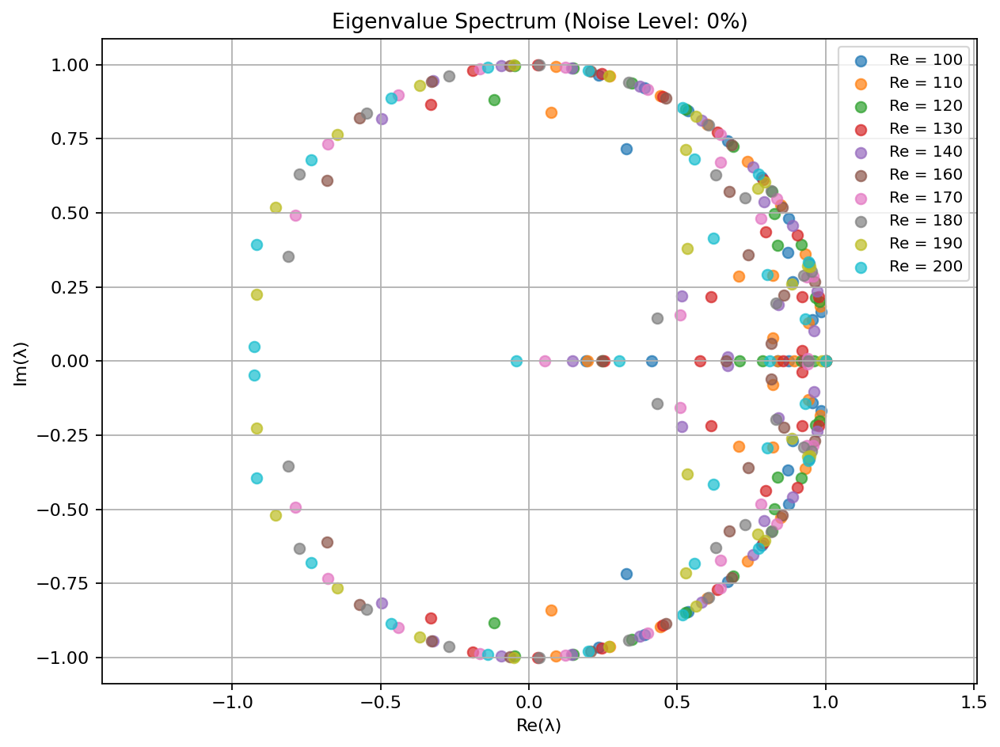

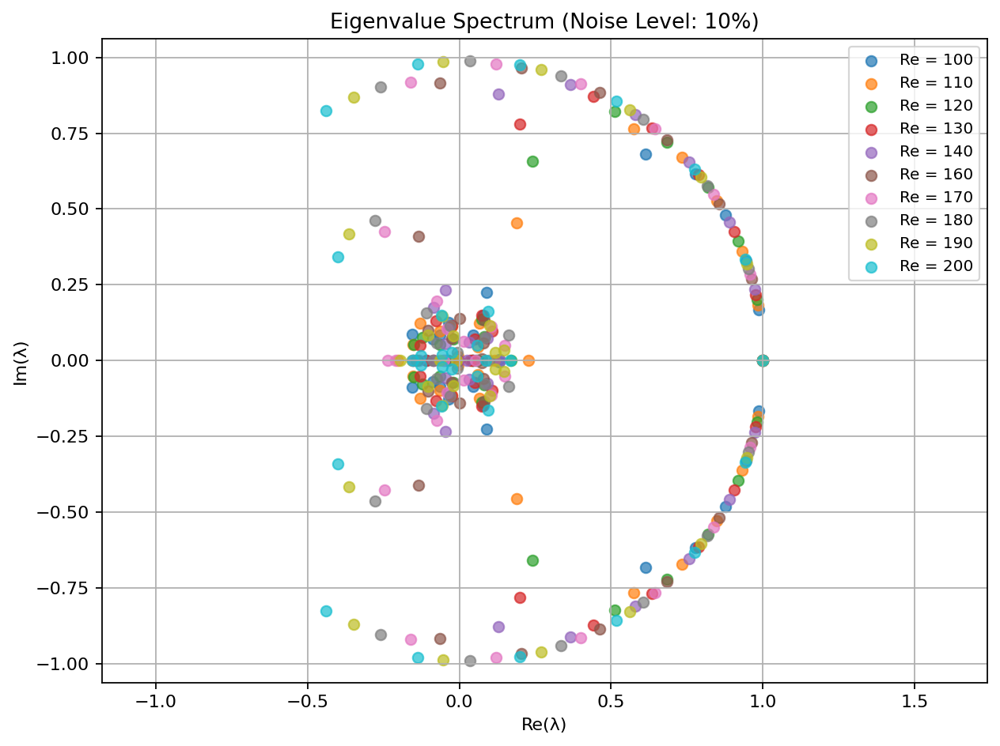

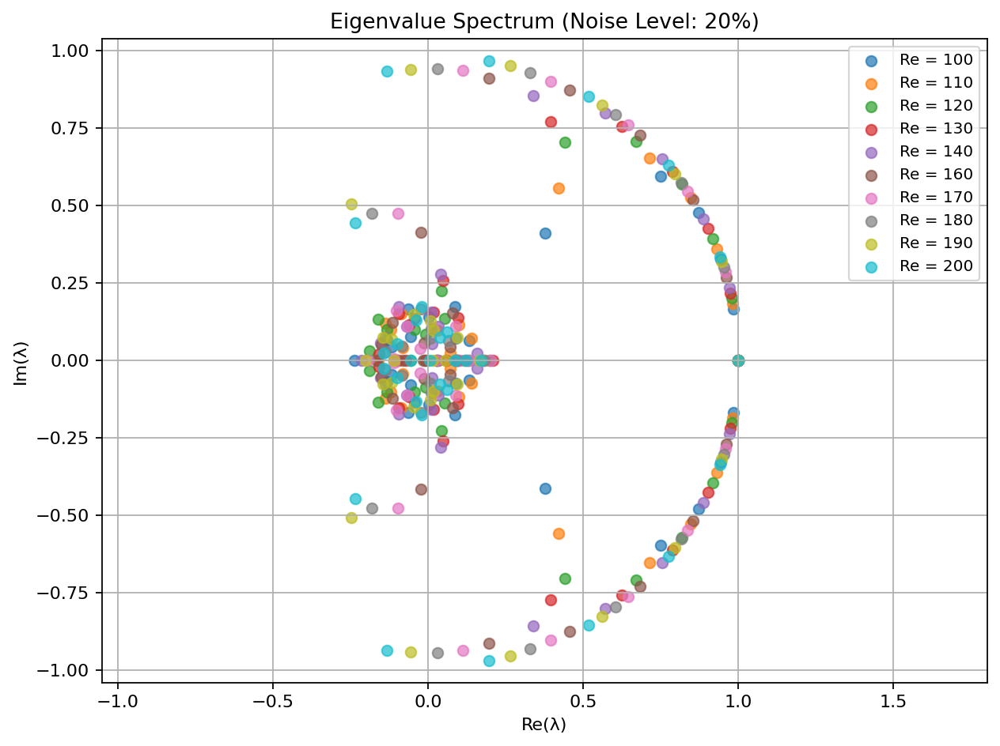

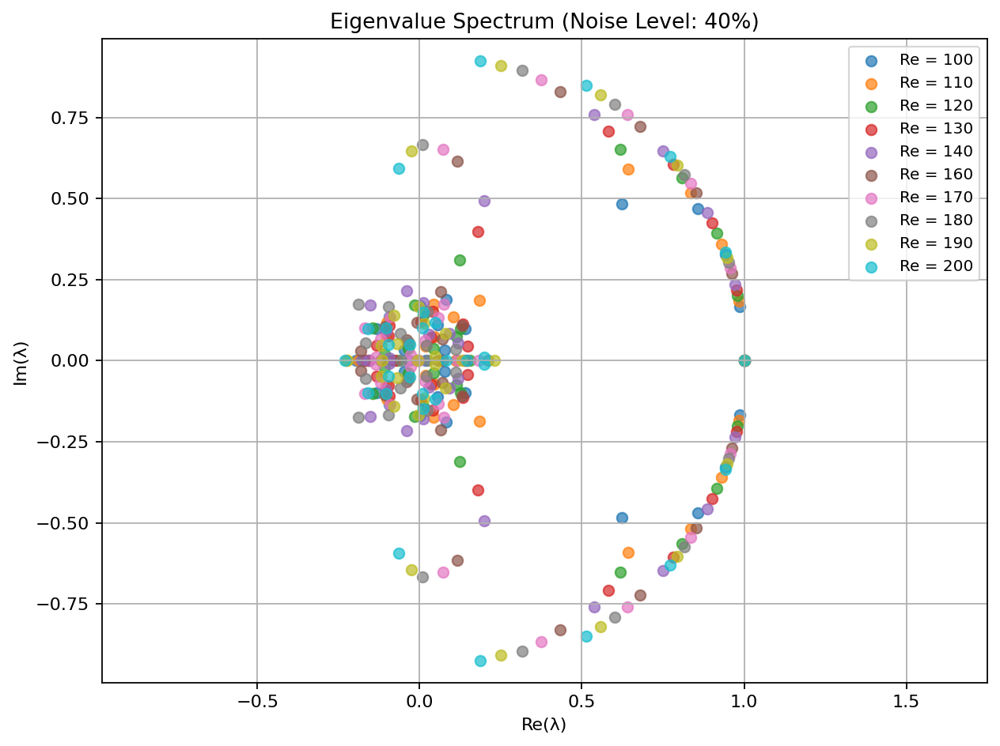

In [24]:
# Eigenvalue spectrum plots for all trained DMD models (per noise level)

for level, model in pdmd_models.items():
    plt.figure(figsize=(8, 6))
    for i, dmd in enumerate(model._dmd):
        eigs = dmd.eigs
        Re = Re_list[i]
        plt.scatter(np.real(eigs), np.imag(eigs),
                    label=f"Re = {Re}", alpha=0.7)
    plt.xlabel("Re(λ)")
    plt.ylabel("Im(λ)")
    plt.title(f"Eigenvalue Spectrum (Noise Level: {level}%)")
    plt.grid(True)
    plt.axis("equal")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    plt.show()





Modal Coefficient Comparison at Re = 160 (Noise Level: 0%)


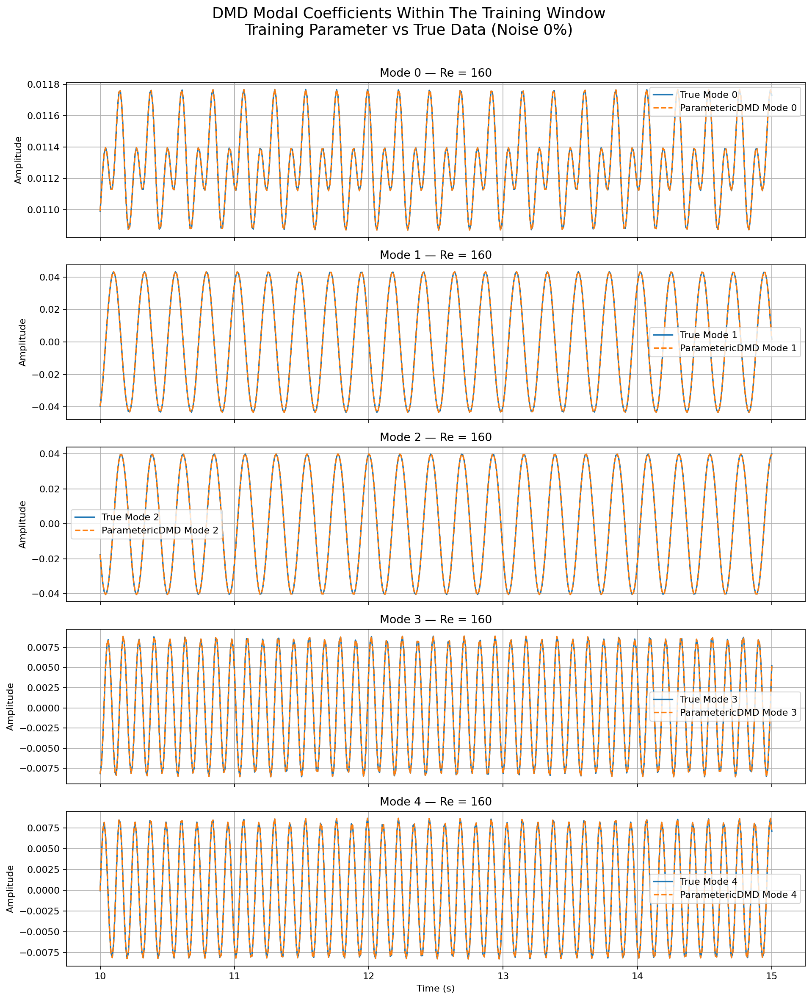


Modal Coefficient Comparison at Re = 160 (Noise Level: 10%)


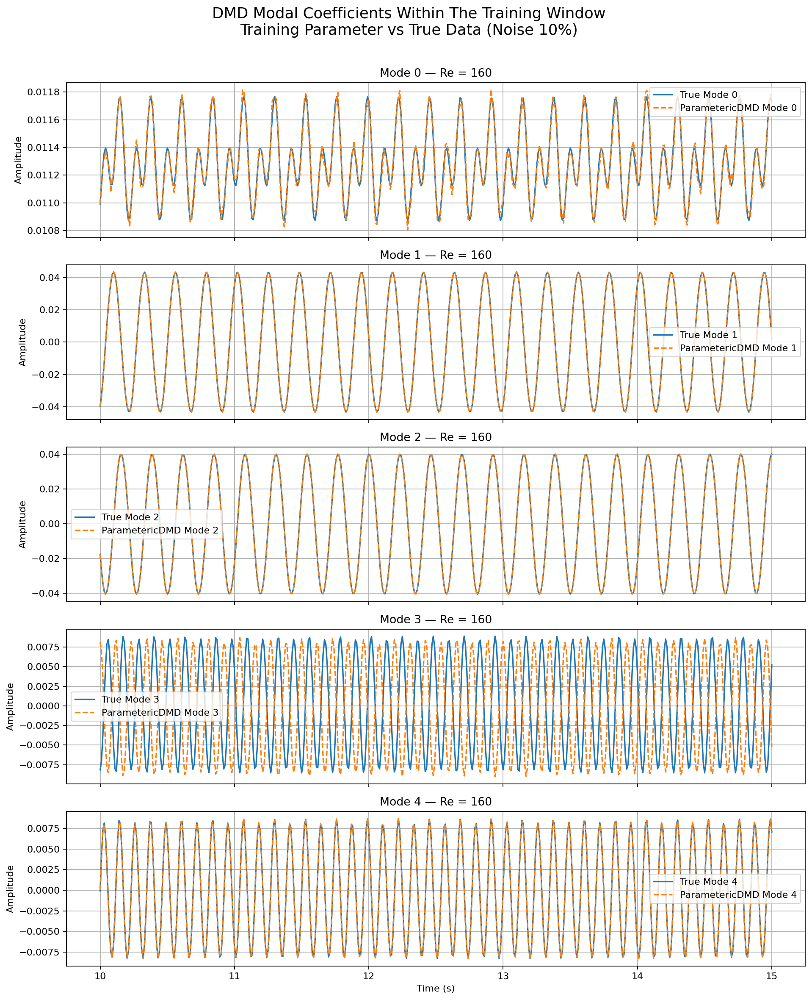


Modal Coefficient Comparison at Re = 160 (Noise Level: 20%)


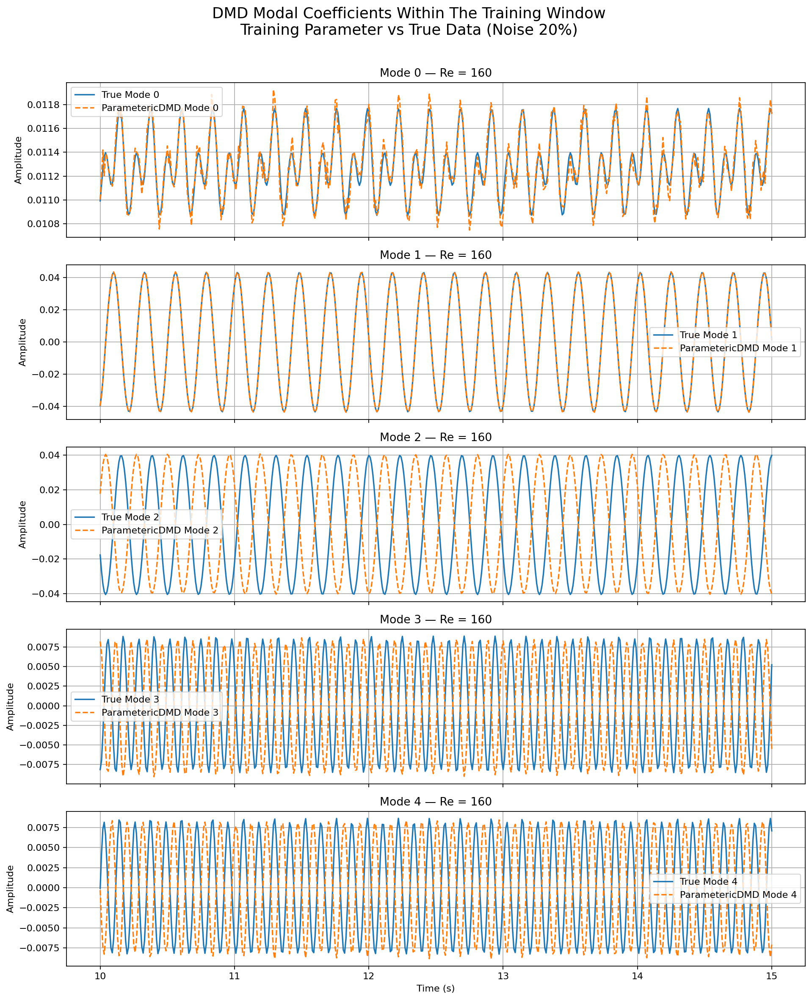


Modal Coefficient Comparison at Re = 160 (Noise Level: 40%)


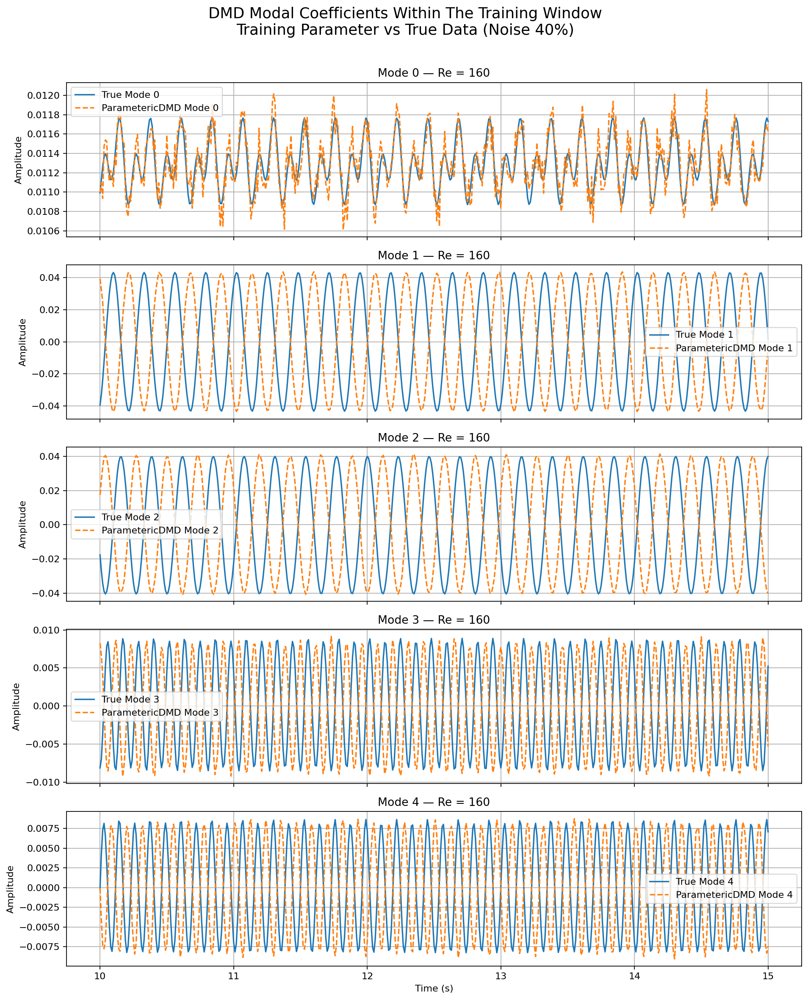

In [25]:
# Plot comparison of DMD modal coefficients for a training parameter i.e., Reynolds number

viz.plot_dmd_modal_comparison(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    sampled_times_dict=sampled_times_dict,
    cached_modal_coeffs=cached_modal_coeffs,
    Re_target=160,
    n_modes_to_plot=5
)



FFT of Training Modal Coefficients at Re = 160 (Noise Level: 0%)


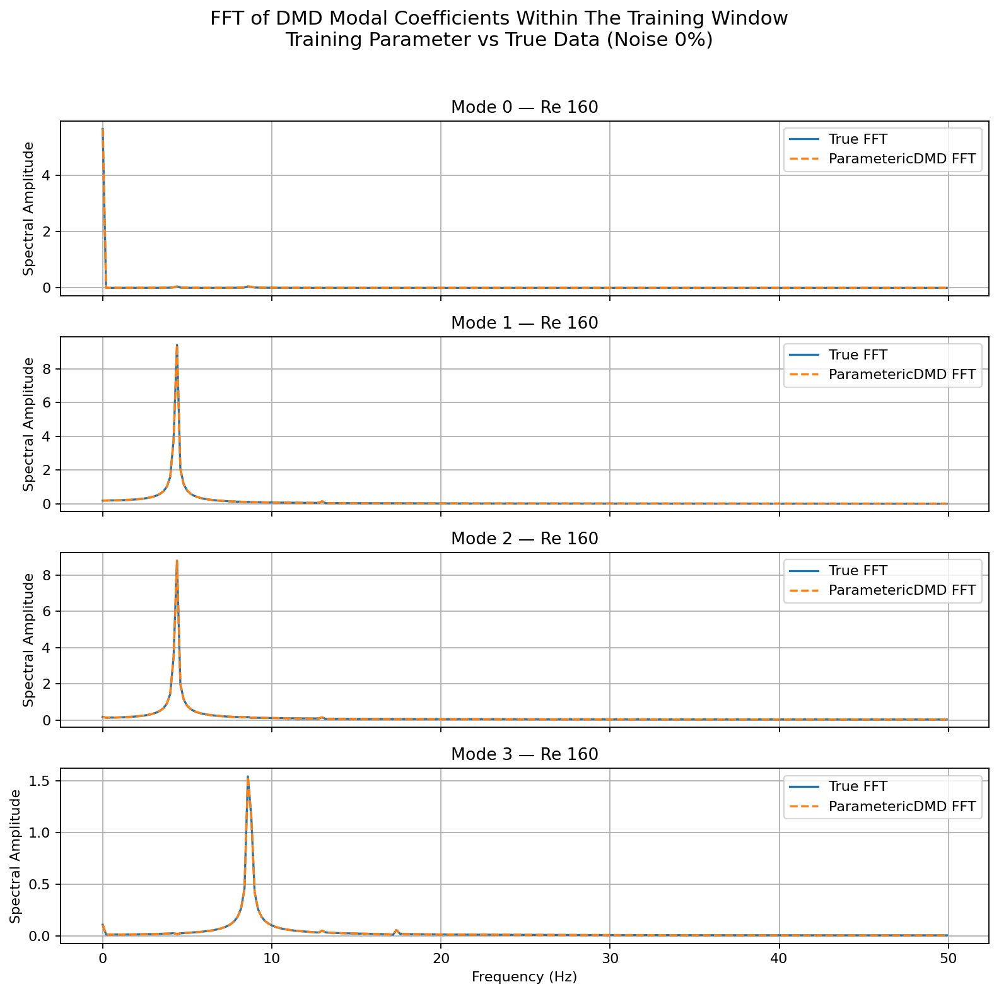


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 10%)


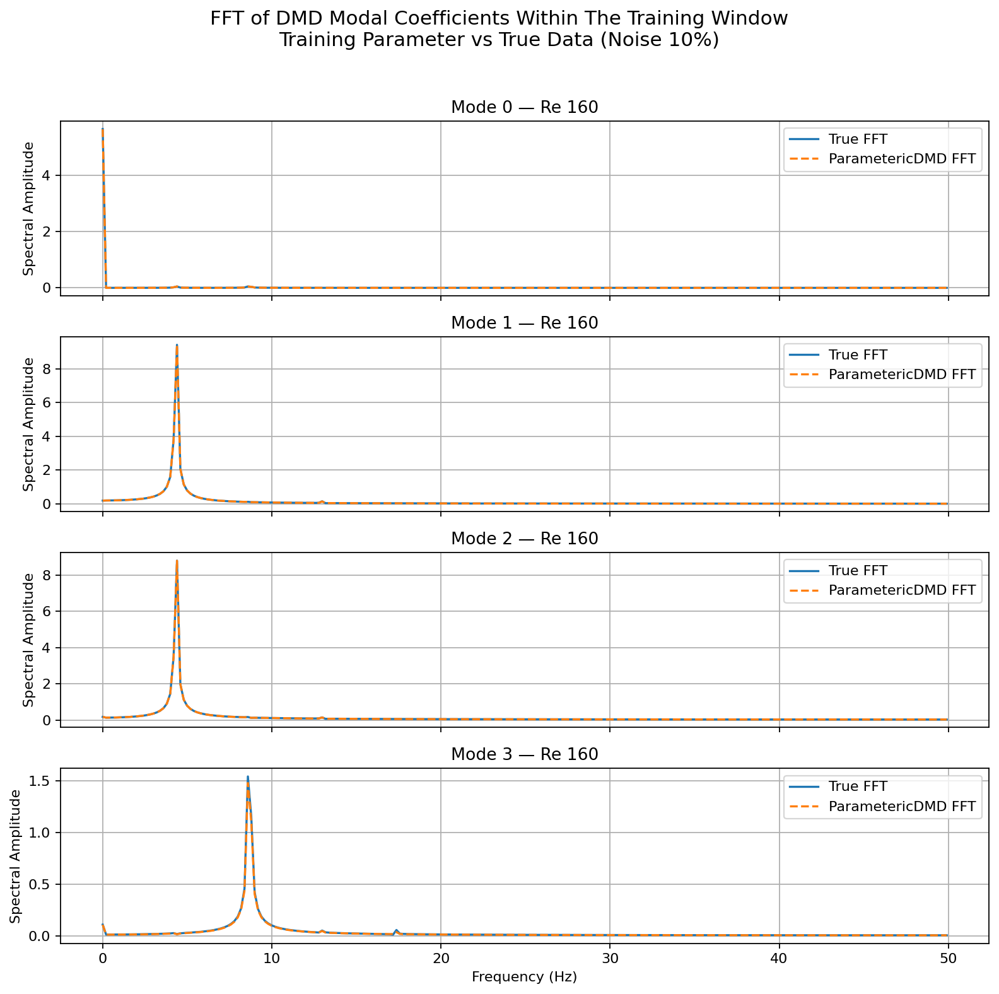


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 20%)


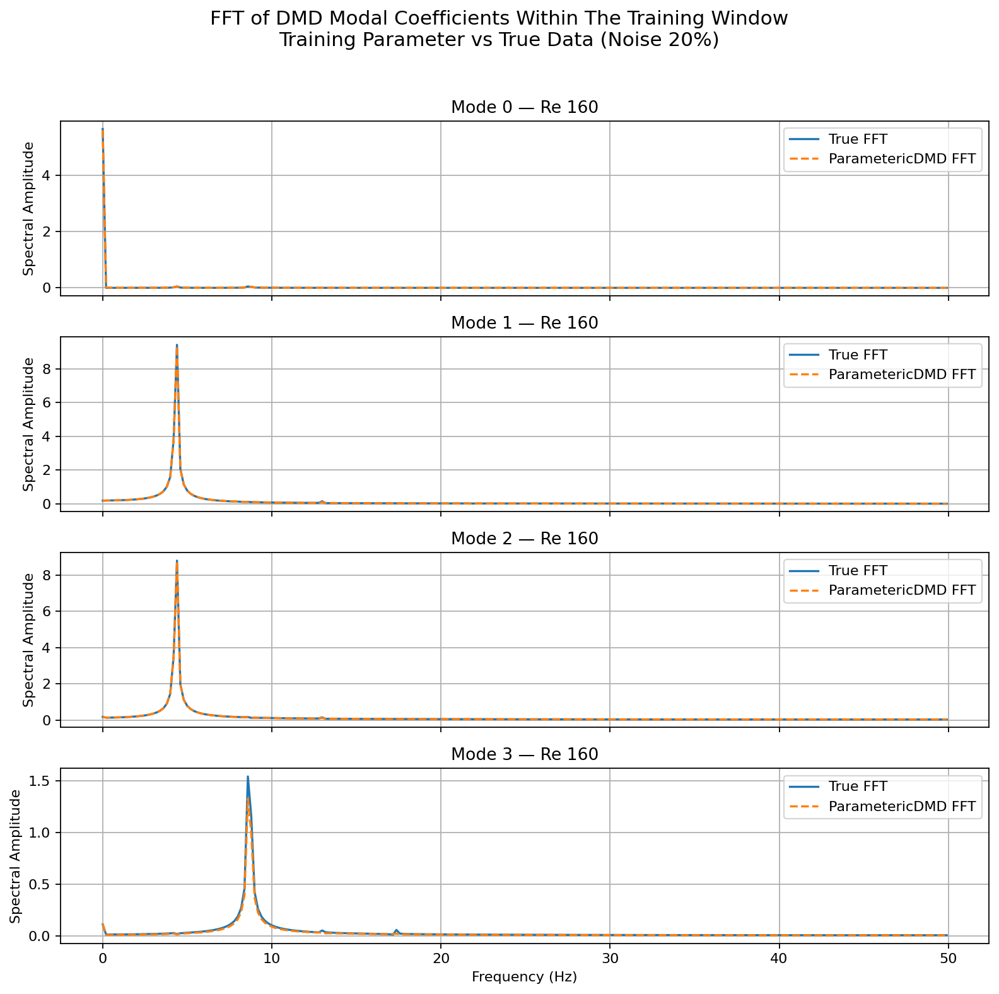


FFT of Training Modal Coefficients at Re = 160 (Noise Level: 40%)


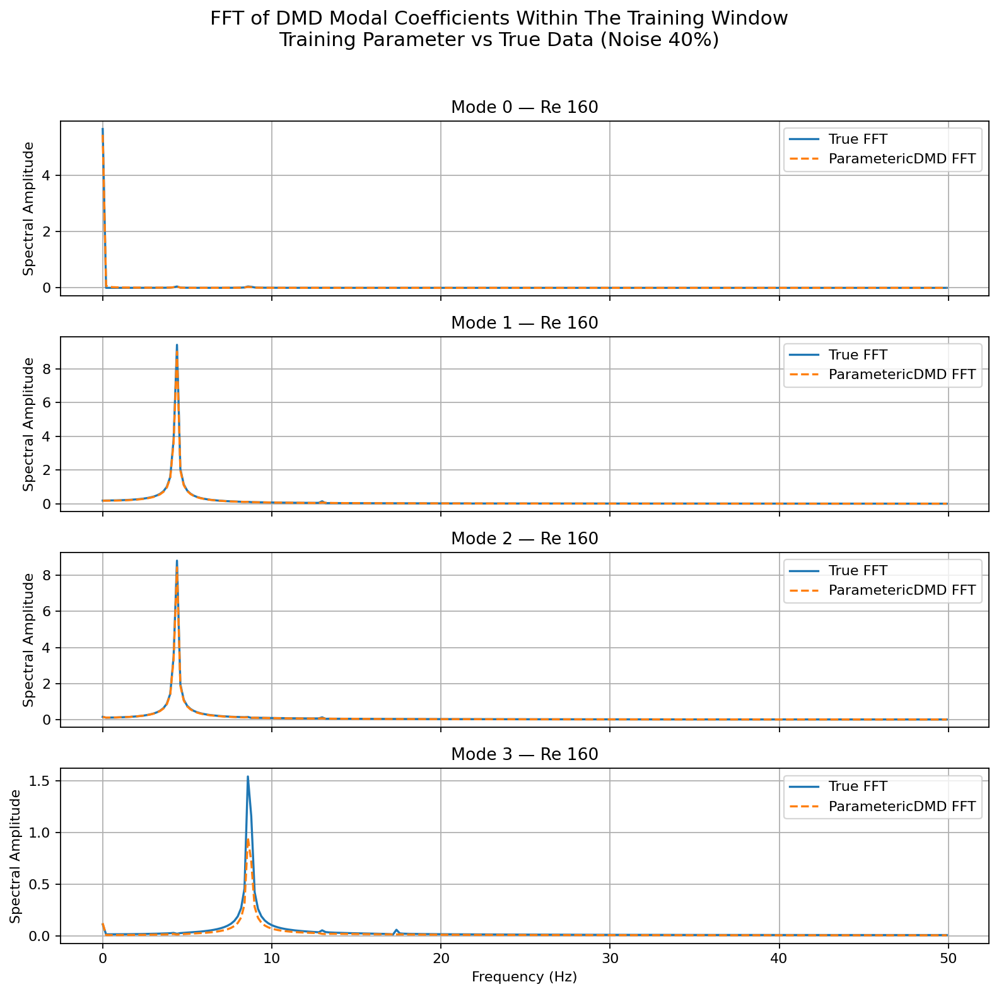

In [26]:
# Plot comparison of DMD FFT modal coefficients for a training parameter i.e., Reynolds number

viz.plot_dmd_modal_fft_comparison(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    cached_modal_coeffs=cached_modal_coeffs,
    Re_target=160,
    n_modes_to_plot=4,
    dt=0.01
)


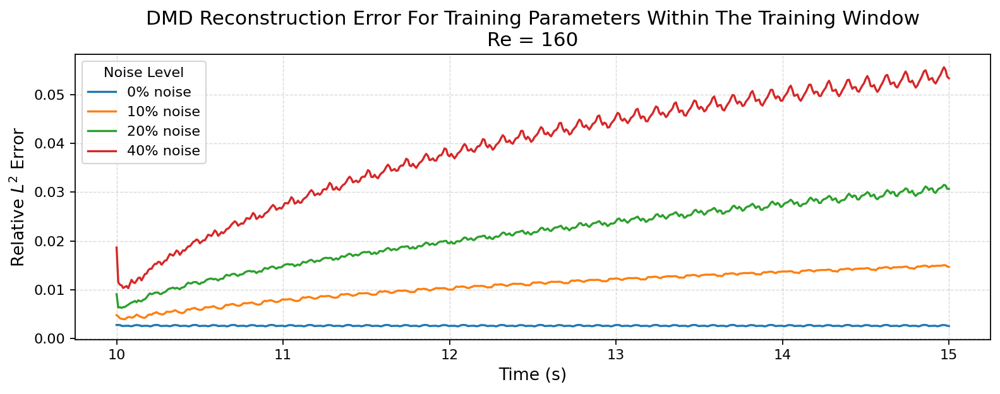

In [27]:
# Plot relative L2 reconstruction error over time for a training parameter i.e., Reynolds number

viz.plot_dmd_reconstruction_error(
    pdmd_models=pdmd_models,
    Re_list=Re_list,
    sampled_times_dict=sampled_times_dict,
    snapshot_processed_dict=snapshot_processed_dict,
    norm_scales=norm_scales,
    mean_flow=mean_flow,
    Re_target=160
)


## Online Phase

## Step 2: Forecasting and interpolation for unkonwn Reynolds number

In [28]:
# Define test Reynolds number
Re_test = 150

# Use sampled times from the first Re in training list
training_times = np.array(sampled_times_dict[Re_list[0]], dtype=float)

# Loop over all noise-level models
for level, pdmd in pdmd_models.items():
    # Step 1: Define forecasting time range
    pdmd.dmd_time["t0"]   = pdmd.original_time["tend"]
    pdmd.dmd_time["tend"] = pdmd.original_time["tend"] + 500 - 1e-12
    pdmd.dmd_time["dt"]   = pdmd.original_time["dt"]

    # Step 2: Set target Re for interpolation
    pdmd.parameters = np.array([[Re_test]])

    # Step 3: Trigger reconstruction (includes forecasting)
    forecasted_snapshots = pdmd.reconstructed_data  # shape: (1, space_dim, time_steps)
    forecasted_field = forecasted_snapshots[0]

    # Step 4: Print diagnostics
    print(f"\nNoise level {level}%:")
    print(
        f"Forecasting from t = {pdmd.dmd_time['t0']} to t = {pdmd.dmd_time['tend']} "
        f"with Δt = {pdmd.dmd_time['dt']}"
    )
    print("Time vector:", pdmd.dmd_timesteps[:10], "...")
    print("Forecasted field shape:", forecasted_field.shape)



Noise level 0%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 10%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 20%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)

Noise level 40%:
Forecasting from t = 500 to t = 999.999999999999 with Δt = 1
Time vector: [500. 501. 502. 503. 504. 505. 506. 507. 508. 509.] ...
Forecasted field shape: (11492, 501)


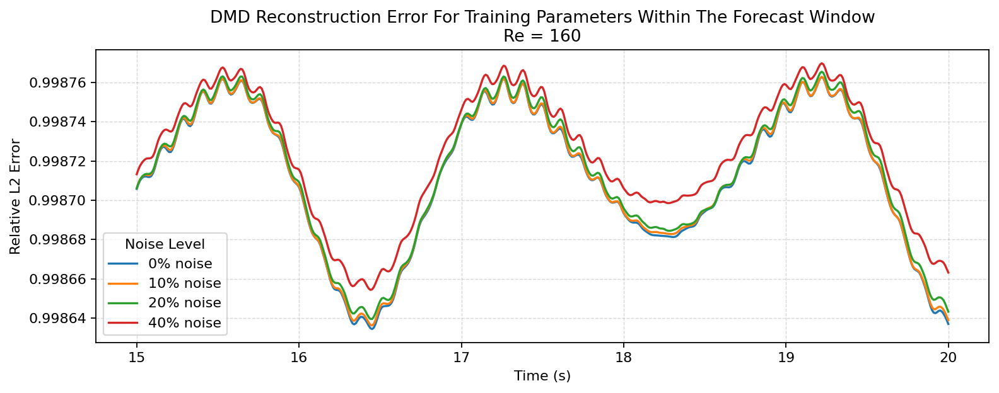

In [29]:
# Plot relative L2 DMD reconstruction error over Forecast time for a training parameter i.e., Reynolds number


viz.plot_dmd_forecast_error(
    pdmd_models=pdmd_models,
    Re_target=160,
    snapshot_future_dict=snapshot_future_dict,
    sampled_times_future_dict=sampled_times_future_dict,
    norm_scales=norm_scales,
    mean_flow=mean_flow
)


Noise 0%: matched 501 time points.


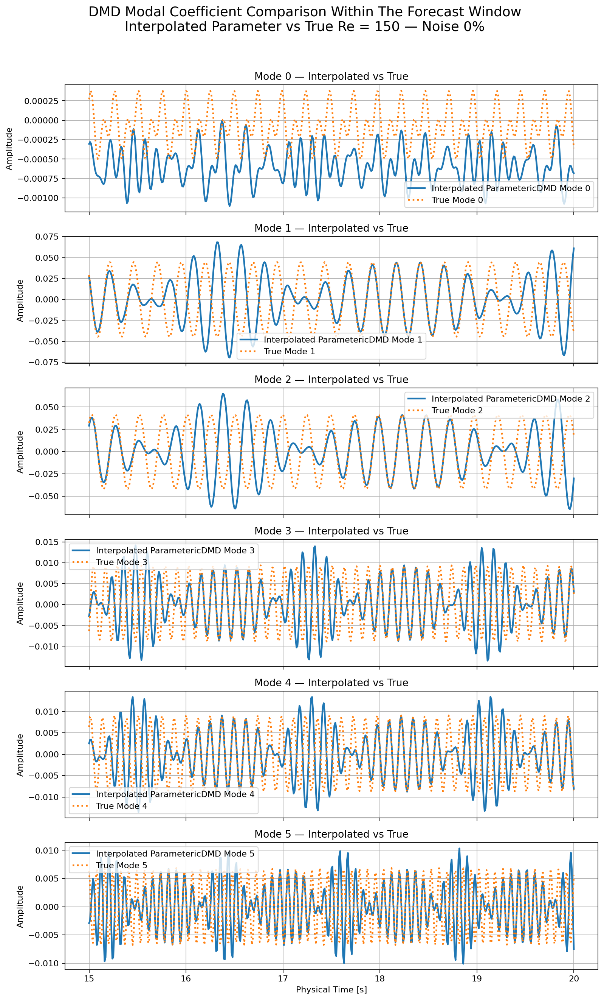

Noise 10%: matched 501 time points.


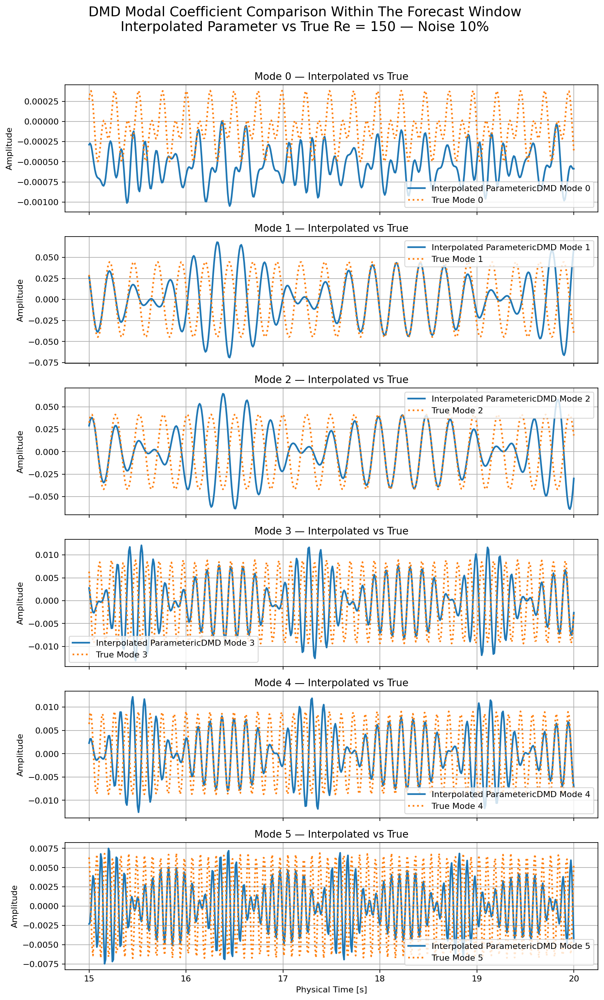

Noise 20%: matched 501 time points.


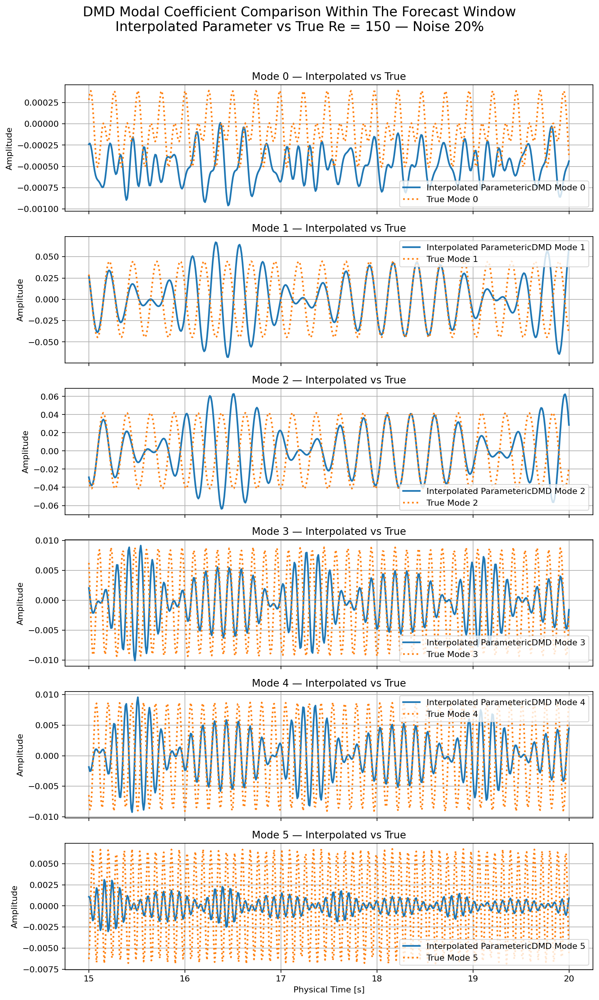

Noise 40%: matched 501 time points.


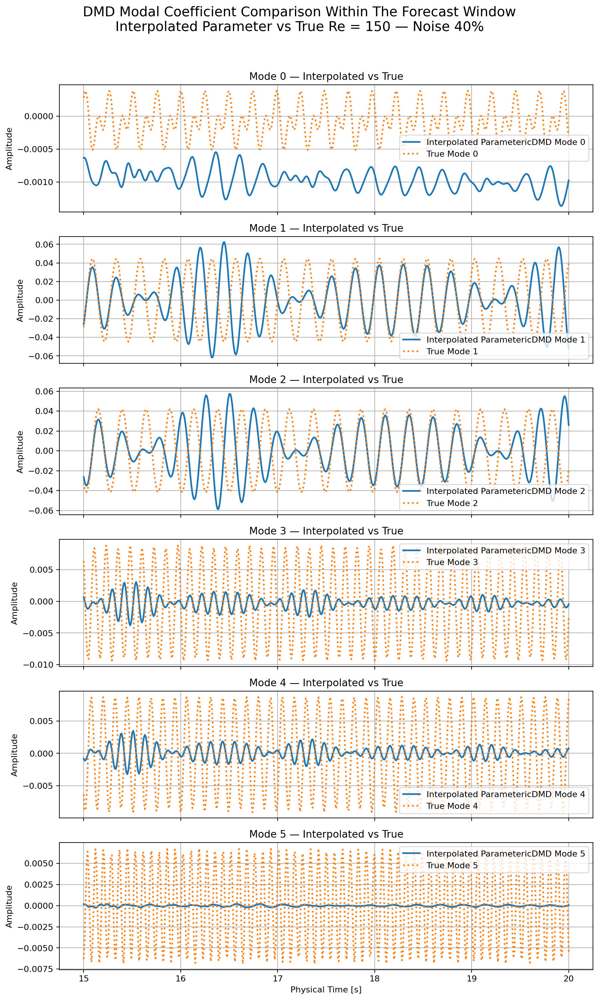

In [30]:
# Plot modal coefficient comparison over the forecast window Interpolated vs True for a training parameter i.e., Reynolds number

viz.plot_interpolated_vs_true_modal_coeffs(
    pdmd_models=pdmd_models,
    data=data,
    Re_test=150,
    mean_flow=mean_flow,
    dt_phys=0.01,
    t0_phys=15.0,
    n_modes_to_plot=6
)


Noise 0%: matched 501 time points.


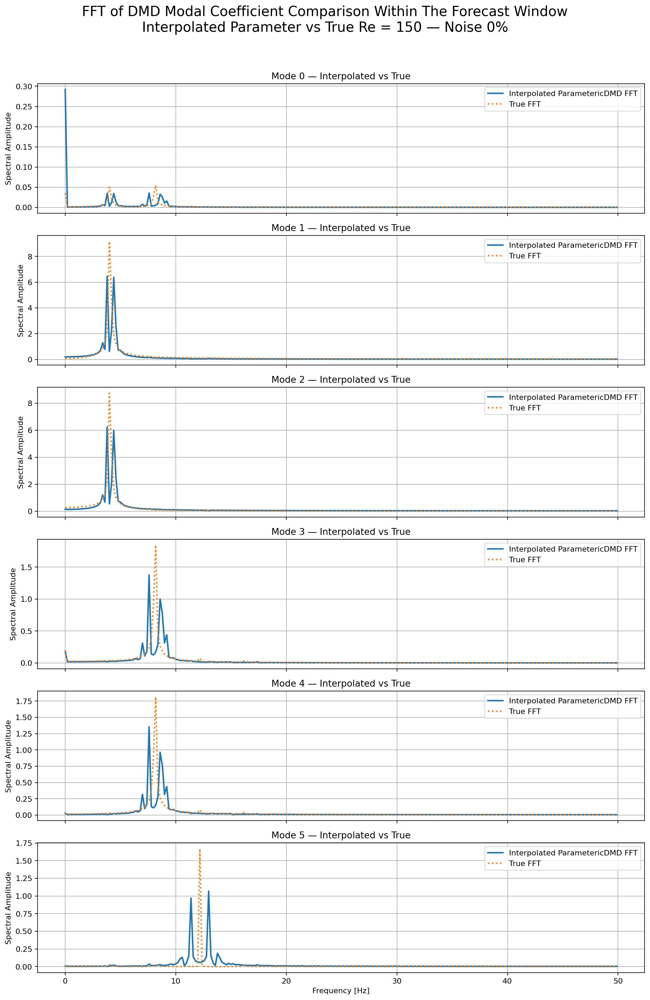

Noise 10%: matched 501 time points.


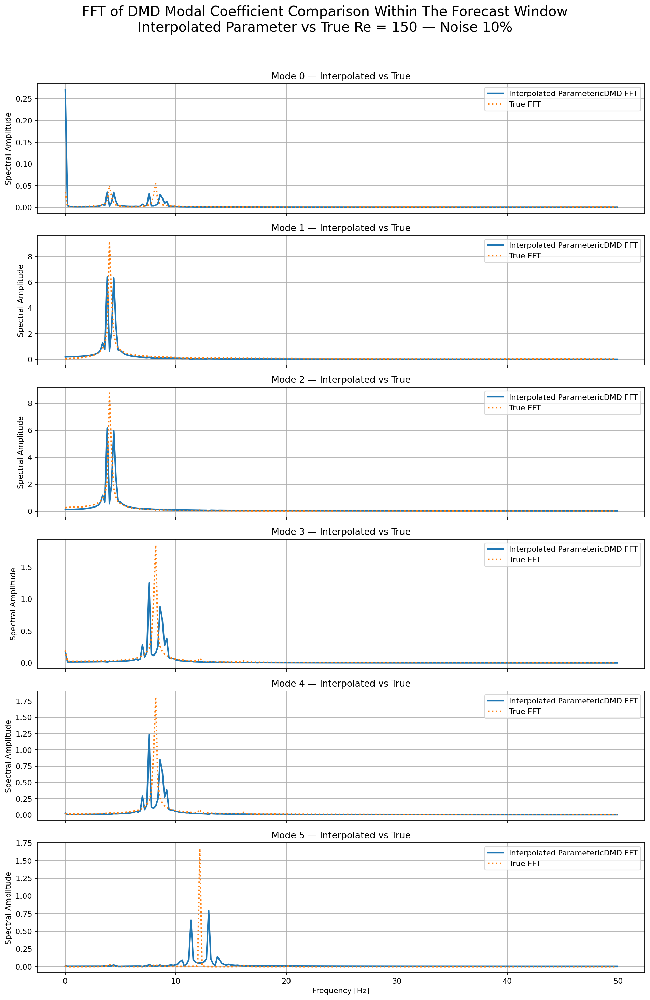

Noise 20%: matched 501 time points.


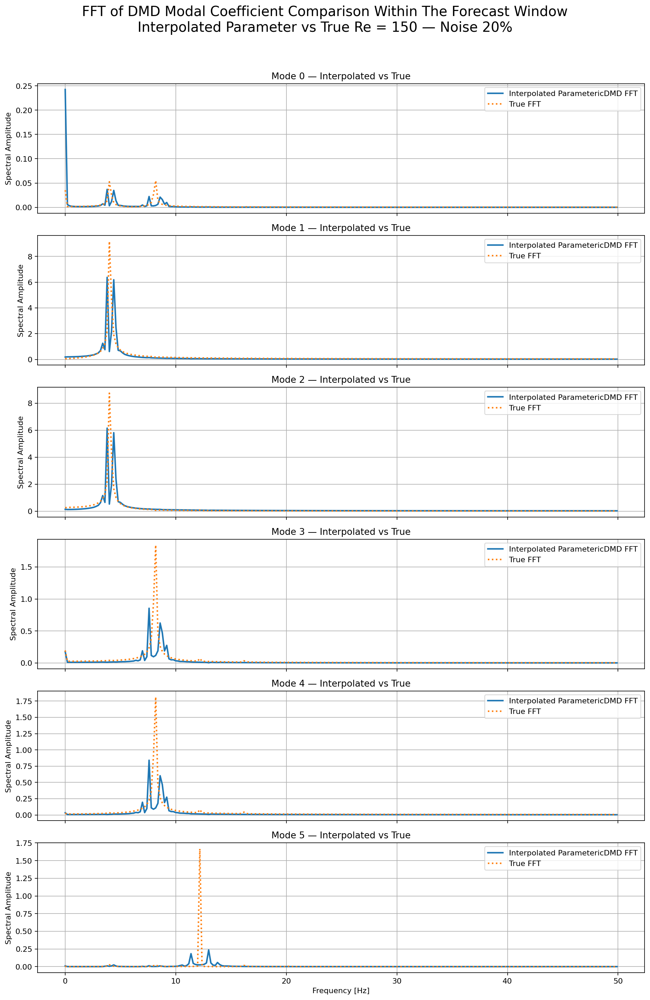

Noise 40%: matched 501 time points.


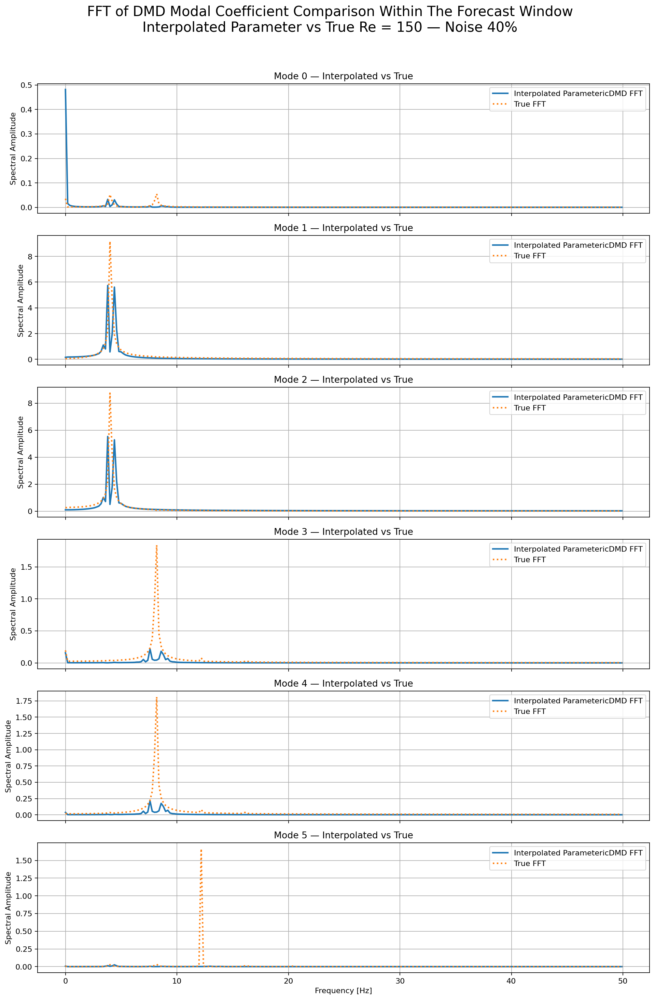

In [31]:
# Plot FFT comparison of modal coefficients over the forecast window Interpolated vs True for the interpolated parameter i.e., Reynolds number

viz.plot_fft_interpolated_vs_true_modal_coeffs(
    pdmd_models=pdmd_models,
    snapshot_test=data["snapshot_dict"][150],
    sampled_times_test=data["sampled_times_dict"][150],
    mean_flow=mean_flow,
    Re_interp=150,
    dt_phys=0.01,
    t0_phys=15.0,
    n_modes_to_plot=6
)


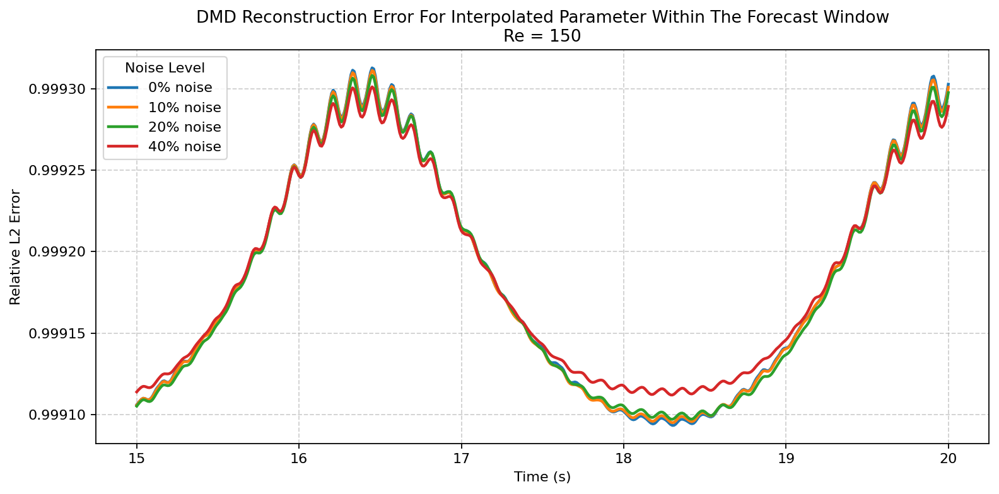

In [32]:
# Plot relative L2 DMD reconstruction error over Forecast time for the interpolated parameter i.e., Reynolds number


viz.plot_future_window_error_interpolated(
    pdmd_models=pdmd_models,
    data=data,
    Re_test=150,
    norm_scales=norm_scales,
    mean_flow=mean_flow,
    t_start=15.0,
    t_end=20.0
)
